In [1]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install -q git+https://github.com/huggingface/transformers.git
!pip install datasets
!pip install -q monai
!pip install patchify

  Cloning https://github.com/facebookresearch/segment-anything.git to c:\users\naboth demetrius\appdata\local\temp\pip-req-build-1irpjn9f
  Resolved https://github.com/facebookresearch/segment-anything.git to commit 6fdee8f2727f4506cfbbe553e23b895e27956588
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for segment-anything: filename=segment_anything-1.0-py3-none-any.whl size=36831 sha256=1d28b82a8309415fa5240f39c62c45223a671a0f9ea1f508c4521140dbe0e73e
  Stored in directory: C:\Users\Naboth Demetrius\AppData\Local\Temp\pip-ephem-wheel-cache-x3j75w4p\wheels\15\d7\bd\05f5f23b7dcbe70cbc6783b06f12143b0cf1a5da5c7b52dcc5
Successfully built segment-anything


  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git 'C:\Users\Naboth Demetrius\AppData\Local\Temp\pip-req-build-1irpjn9f'

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
faster-whisper 0.10.0 requires tokenizers<0.16,>=0.13, but you have tokenizers 0.19.1 which is incompatible.
optimum-intel 1.16.0.dev0 requires transformers<4.39.0,>=4.36.0, but you have transformers 4.42.0.dev0 which is incompatible.
whisperx 3.1.1 requires pyannote.audio==3.1.0, but you have pyannote-audio 3.0.0 which is incompatible.

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


  Obtaining dependency information for patchify from https://files.pythonhosted.org/packages/00/ce/d76647d95aad98d5532b5d25801dedda788c6b5d4c7457d30ae3612132af/patchify-0.2.3-py3-none-any.whl.metadata



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [16]:
import os
import cv2
import numpy as np

# Define the paths to your folders
images_folder = r"F:\tooth-cavity-segmentation\data\train"
masks_folder = r"F:\tooth-cavity-segmentation\data\train_mask"

# Initialize empty lists to store image and mask arrays
image_arrays = []
mask_arrays = []

# Loop through all files in the images folder
for filename in os.listdir(images_folder):
  # Check if the file extension is JPG
  if filename.endswith(".jpg"):
    # Construct the full path to the image file
    image_path = os.path.join(images_folder, filename)
    
    # Load the image using OpenCV (BGR format)
    image = cv2.imread(image_path)
  
    # Check if image loaded successfully
    if image is not None:
      # Convert the image to RGB format (if needed)
      image_array = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
      image_arrays.append(image_array)
    else:
      print(f"Error: Failed to load image {filename}")

# Loop through all files in the masks folder (assuming same names as images)
for filename in os.listdir(masks_folder):
  # Check if the file extension is JPG (or modify for your mask format)
  if filename.endswith(".jpg"):
    # Construct the full path to the mask file (assuming same filename as image)
    mask_path = os.path.join(masks_folder, filename)
    
    # Load the mask (adjust loading method based on mask format)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Assuming grayscale masks

    # Check if mask loaded successfully
    if mask is not None:
      # Convert mask to NumPy array
      mask_array = np.asarray(mask)
      mask_arrays.append(mask_array)
    else:
      print(f"Error: Failed to load mask {filename}")

# Convert the lists to NumPy arrays (if needed)
image_arrays = np.array(image_arrays)
mask_arrays = np.array(mask_arrays)

# Print some information (optional)
print(f"Loaded {len(image_arrays)} images and {len(mask_arrays)} masks.")
print(f"Image array shape: {image_arrays.shape}")
print(f"Mask array shape: {mask_arrays.shape}")


Loaded 520 images and 520 masks.
Image array shape: (520, 1024, 1280)
Mask array shape: (520, 1024, 1280)


In [17]:
from patchify import patchify

In [18]:
patch_size = 256
step = 256

In [19]:
all_img_patches = []
for img in range(image_arrays.shape[0]):
    image = image_arrays[img]
    patches_img = patchify(image, (patch_size,patch_size),step=step)
    for i in range(patches_img.shape[0]):
        for j in range(patches_img.shape[1]):
            single_patch_img = patches_img[i,j,:,:]
            all_img_patches.append(single_patch_img)
images = np.array(all_img_patches)

In [20]:
all_mask_patches = []
for img in range(mask_arrays.shape[0]):
    mask = mask_arrays[img]
    patches_mask = patchify(mask, (patch_size,patch_size), step = step)
    for i in range(patches_mask.shape[0]):
        for j in range(patches_mask.shape[1]):
            single_patch_mask = patches_mask[i,j,:,:]
            single_patch_mask = (single_patch_mask/255.).astype(np.uint8)
            all_mask_patches.append(single_patch_mask)
            
    masks = np.array(all_mask_patches)

In [21]:
images.shape

(10400, 256, 256)

In [22]:
masks.shape

(10400, 256, 256)

In [23]:
# Create a list to store the indices of non-empty masks
valid_indices = [i for i, mask in enumerate(masks) if mask.max() != 0]
# Filter the image and mask arrays to keep only the non-empty pairs
filtered_images = images[valid_indices]
filtered_masks = masks[valid_indices]
print("Image shape:", filtered_images.shape)  # e.g., (num_frames, height, width, num_channels)
print("Mask shape:", filtered_masks.shape)

Image shape: (2321, 256, 256)
Mask shape: (2321, 256, 256)


In [24]:
from datasets import Dataset
from PIL import Image

dataset_dict = {
    "image":[Image.fromarray(img).convert("RGB") for img in filtered_images],
    "label":[Image.fromarray(img) for img in filtered_masks],
}


In [25]:
dataset = Dataset.from_dict(dataset_dict)

In [26]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 2321
})

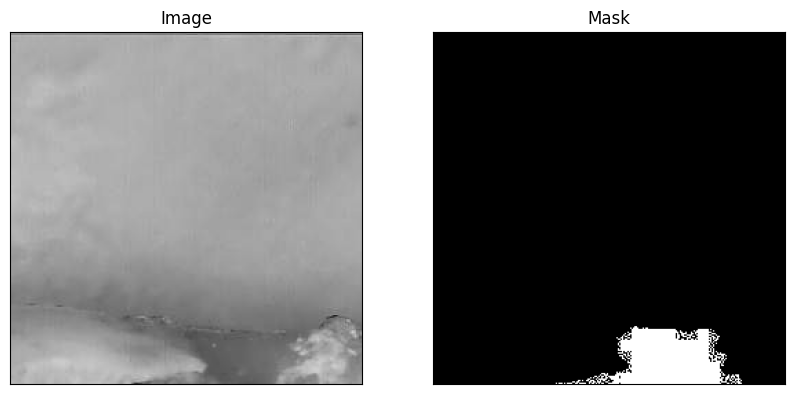

In [27]:
import random
import matplotlib.pyplot as plt

img_num = random.randint(0, filtered_images.shape[0]-1)
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(example_mask, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])


plt.show()

In [28]:
def get_bounding_box(ground_truth_map):
  # get bounding box from mask
  y_indices, x_indices = np.where(ground_truth_map > 0)
  x_min, x_max = np.min(x_indices), np.max(x_indices)
  y_min, y_max = np.min(y_indices), np.max(y_indices)
  # add perturbation to bounding box coordinates
  H, W = ground_truth_map.shape
  x_min = max(0, x_min - np.random.randint(0, 20))
  x_max = min(W, x_max + np.random.randint(0, 20))
  y_min = max(0, y_min - np.random.randint(0, 20))
  y_max = min(H, y_max + np.random.randint(0, 20))
  bbox = [x_min, y_min, x_max, y_max]

  return bbox

In [29]:
from torch.utils.data import Dataset

class SAMDataset(Dataset):
  """
  This class is used to create a dataset that serves input images and masks.
  It takes a dataset and a processor as input and overrides the __len__ and __getitem__ methods of the Dataset class.
  """
  def __init__(self, dataset, processor):
    self.dataset = dataset
    self.processor = processor

  def __len__(self):
    return len(self.dataset)

  def __getitem__(self, idx):
    item = self.dataset[idx]
    image = item["image"]
    ground_truth_mask = np.array(item["label"])

    # get bounding box prompt
    prompt = get_bounding_box(ground_truth_mask)
    
    # prepare image and prompt for the model
    inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")

    # remove batch dimension which the processor adds by default
    inputs = {k:v.squeeze(0) for k,v in inputs.items()}

    # add ground truth segmentation
    inputs["ground_truth_mask"] = ground_truth_mask

    return inputs

In [30]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

In [31]:
model_config = SamConfig.from_pretrained("facebook/sam-vit-base")
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")


my_mito_model = SamModel(config=model_config)

my_mito_model.load_state_dict(torch.load(r"F:\tooth-cavity-segmentation\mito_model_checkpoint_.pth"))
     

f:\gpt\cuda\Lib\site-packages\huggingface_hub\file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


FileNotFoundError: [Errno 2] No such file or directory: 'F:\\tooth-cavity-segmentation\\mito_model_checkpoint_.pth'

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.to(device)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

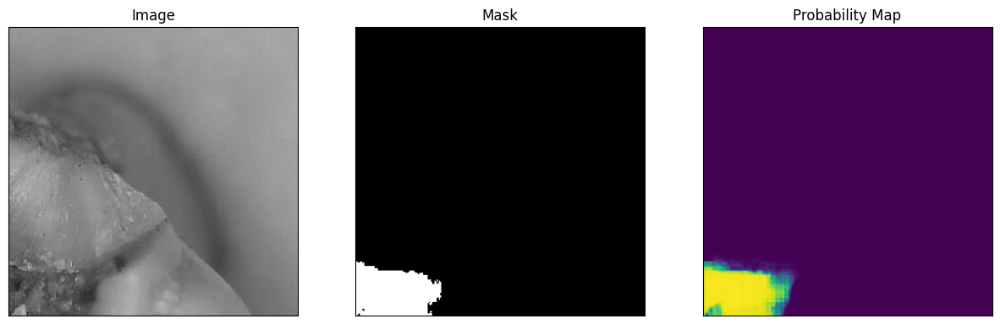

In [ ]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# let's take a random training example
idx = random.randint(0, filtered_images.shape[0]-1)

# load image
test_image = dataset[idx]["image"]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset[idx]["label"])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the second image on the right
axes[2].imshow(medsam_seg_prob)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

In [ ]:
large_test_image = image_arrays[1]

In [ ]:
patches = patchify(large_test_image,(256,256),step=256)

In [ ]:
array_size = 256

# Define the size of your grid
grid_size = 10

# Generate the grid points
x = np.linspace(0, array_size-1, grid_size)
y = np.linspace(0, array_size-1, grid_size)

# Generate a grid of coordinates
xv, yv = np.meshgrid(x, y)

# Convert the numpy arrays to lists
xv_list = xv.tolist()
yv_list = yv.tolist()

# Combine the x and y coordinates into a list of list of lists
input_points = [[[int(x), int(y)] for x, y in zip(x_row, y_row)] for x_row, y_row in zip(xv_list, yv_list)]

#We need to reshape our nxn grid to the expected shape of the input_points tensor
# (batch_size, point_batch_size, num_points_per_image, 2),
# where the last dimension of 2 represents the x and y coordinates of each point.
#batch_size: The number of images you're processing at once.
#point_batch_size: The number of point sets you have for each image.
#num_points_per_image: The number of points in each set.
input_points = torch.tensor(input_points).view(1, 1, grid_size*grid_size, 2)

In [ ]:

print(np.array(input_points).shape)

(1, 1, 100, 2)


In [ ]:

patches.shape

(4, 5, 256, 256)

In [ ]:
def predict(i,j):

  # Selectelected patch for segmentation
  random_array = patches[i, j]


  single_patch = Image.fromarray(random_array).convert("RGB")
  # prepare image for the model

  #First try without providing any prompt (no bounding box or input_points)
  #inputs = processor(single_patch, return_tensors="pt")
  #Now try with bounding boxes. Remember to uncomment.
  inputs = processor(single_patch, input_points=input_points, return_tensors="pt")

  # Move the input tensor to the GPU if it's not already there
  inputs = {k: v.to(device) for k, v in inputs.items()}
  my_mito_model.eval()


  # forward pass
  with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

  # apply sigmoid
  single_patch_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
  # convert soft mask to hard mask
  single_patch_prob = single_patch_prob.cpu().numpy().squeeze()
  single_patch_prediction = (single_patch_prob > 0.5).astype(np.uint8)


  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  # Plot the first image on the left
  axes[0].imshow(np.array(single_patch), cmap='gray')  # Assuming the first image is grayscale
  axes[0].set_title("Image")

  # Plot the second image on the right
  axes[1].imshow(single_patch_prob)  # Assuming the second image is grayscale
  axes[1].set_title("Probability Map")

  # Plot the second image on the right
  axes[2].imshow(single_patch_prediction, cmap='gray')  # Assuming the second image is grayscale
  axes[2].set_title("Prediction")

  # Hide axis ticks and labels
  for ax in axes:
      ax.set_xticks([])
      ax.set_yticks([])
      ax.set_xticklabels([])
      ax.set_yticklabels([])

  # Display the images side by side
  plt.show()

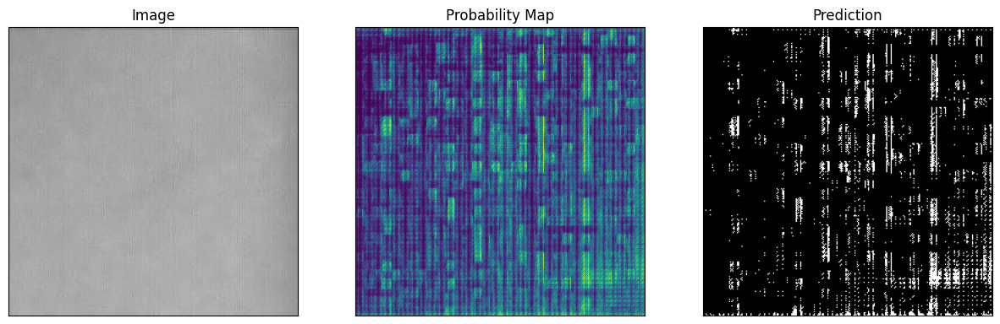

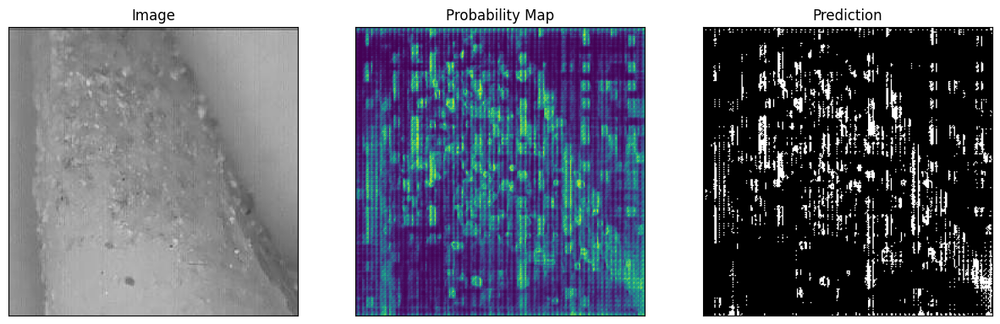

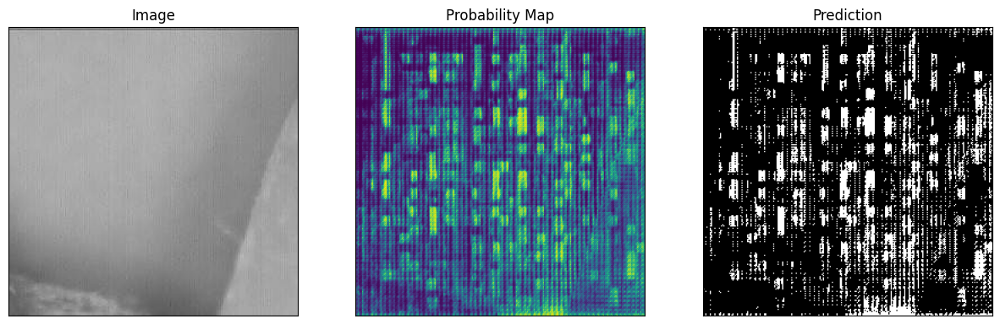

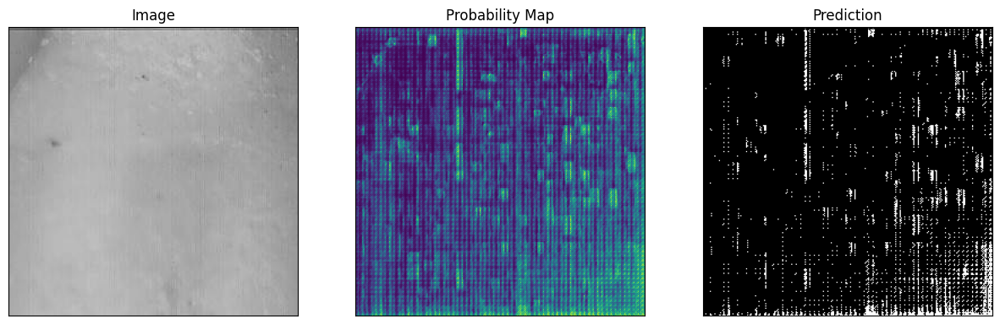

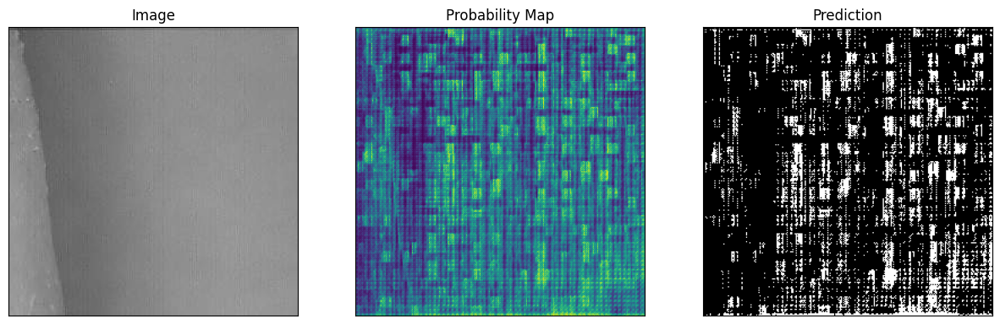

...

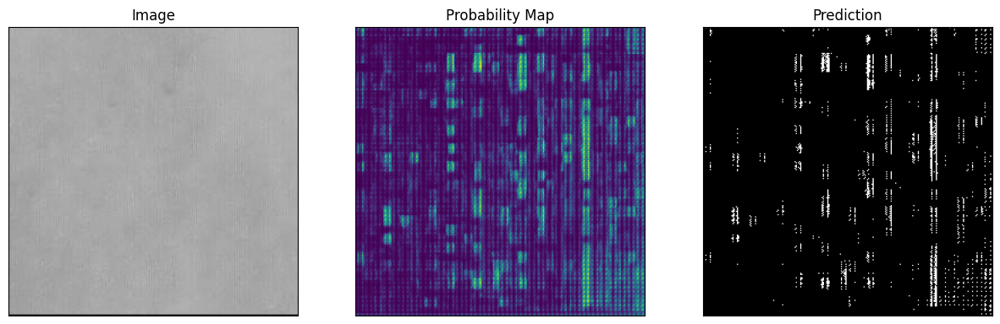

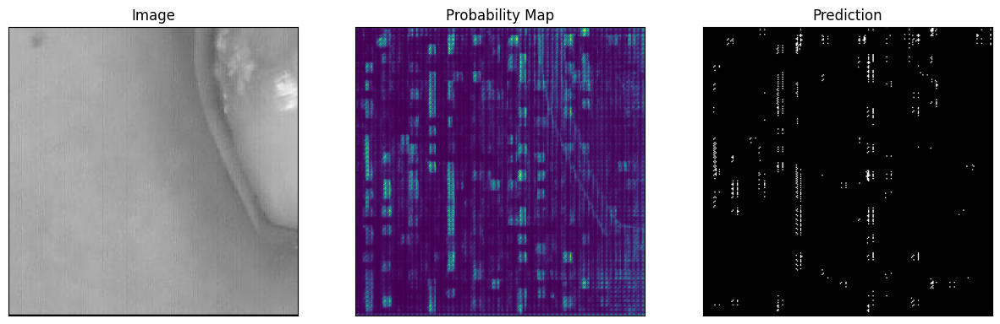

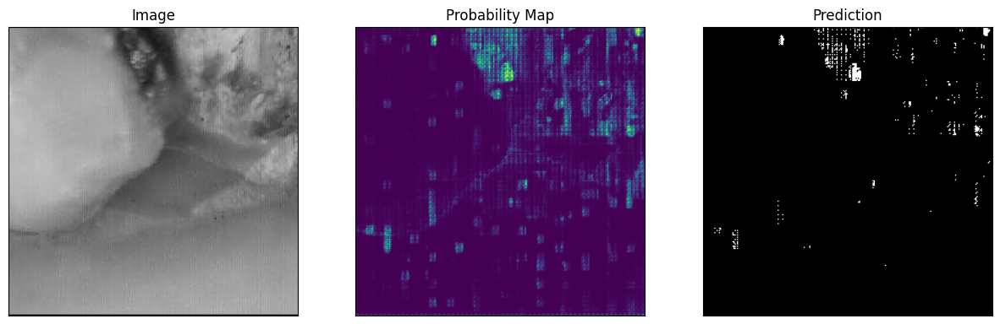

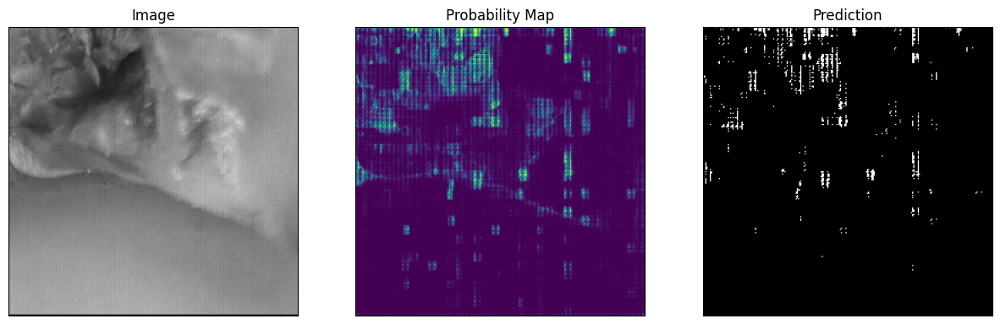

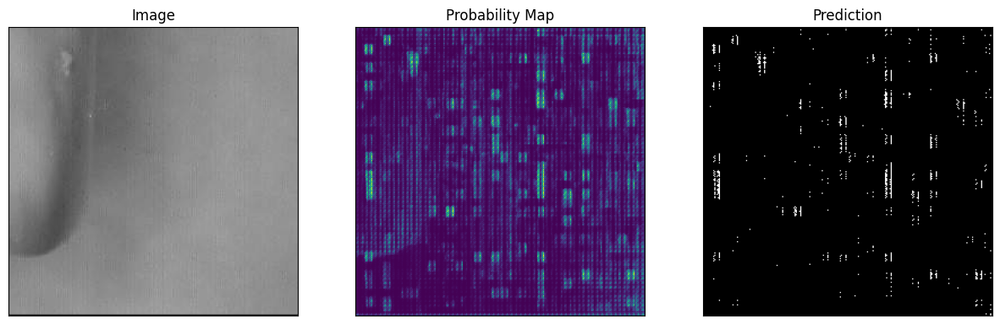

In [ ]:
for i in range(4):
    for j in range(5):
        predict(i,j)